In [2]:
!pip install -U aicrowd-cli

# Installing TOrch
!pip install pyyaml==5.1
!pip install torch==1.7.1 torchvision==0.8.2
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

# Installing Detectron2
import torch
assert torch.__version__.startswith("1.7")   
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html

  Using cached torch-1.7.1-cp37-cp37m-manylinux1_x86_64.whl (776.8 MB)
  Using cached torchvision-0.8.2-cp37-cp37m-manylinux1_x86_64.whl (12.8 MB)
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.7.1 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.7.1 which is incompatible.
1.7.1 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.co

In [3]:
API_KEY = "d5ce307d2285c2f06111687440d6b53e" 
!aicrowd login --api-key $API_KEY

API Key valid
Saved API Key successfully!


In [4]:
!aicrowd dataset download --challenge debris-detection

sample_submission.csv: 100% 1.98M/1.98M [00:00<00:00, 2.04MB/s]
test.zip: 100% 259M/259M [00:36<00:00, 7.18MB/s]
train.csv: 100% 1.78M/1.78M [00:01<00:00, 1.69MB/s]
train.zip: 100% 1.04G/1.04G [02:43<00:00, 6.34MB/s]
val.csv: 100% 176k/176k [00:00<00:00, 405kB/s]
val.zip: 100% 104M/104M [00:14<00:00, 6.94MB/s]


In [5]:
!rm -rf data
!mkdir data

!unzip train.zip -d data/train > /dev/null

!unzip val.zip -d data/val > /dev/null

!unzip test.zip -d data/test > /dev/null

!mv train.csv data/train.csv
!mv val.csv data/val.csv

In [6]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

import pandas as pd
import numpy as np
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import cv2
import random
from ast import literal_eval

In [7]:
data_path = "data"

train_df = pd.read_csv(os.path.join(data_path, "train.csv"))
val_df = pd.read_csv(os.path.join(data_path, "val.csv"))

In [8]:
train_df

,ImageID,bboxes
0,0,"[[282, 308, 58, 86], [228, 256, 191, 218], [10..."
1,1,"[[97, 127, 297, 332], [315, 352, 136, 168], [7..."
2,2,"[[45, 76, 244, 269], [154, 182, 457, 484], [20..."
3,3,"[[252, 282, 86, 110], [315, 333, 379, 412], [2..."
4,4,"[[175, 203, 406, 440], [57, 86, 433, 464], [26..."
...,...,...
19995,19995,"[[226, 247, 396, 424], [301, 323, 454, 479], [..."
19996,19996,"[[228, 256, 149, 177], [42, 71, 294, 331], [28..."
19997,19997,"[[443, 474, 153, 181], [138, 166, 193, 219], [..."
19998,19998,"[[34, 70, 178, 217], [400, 443, 127, 161], [43..."


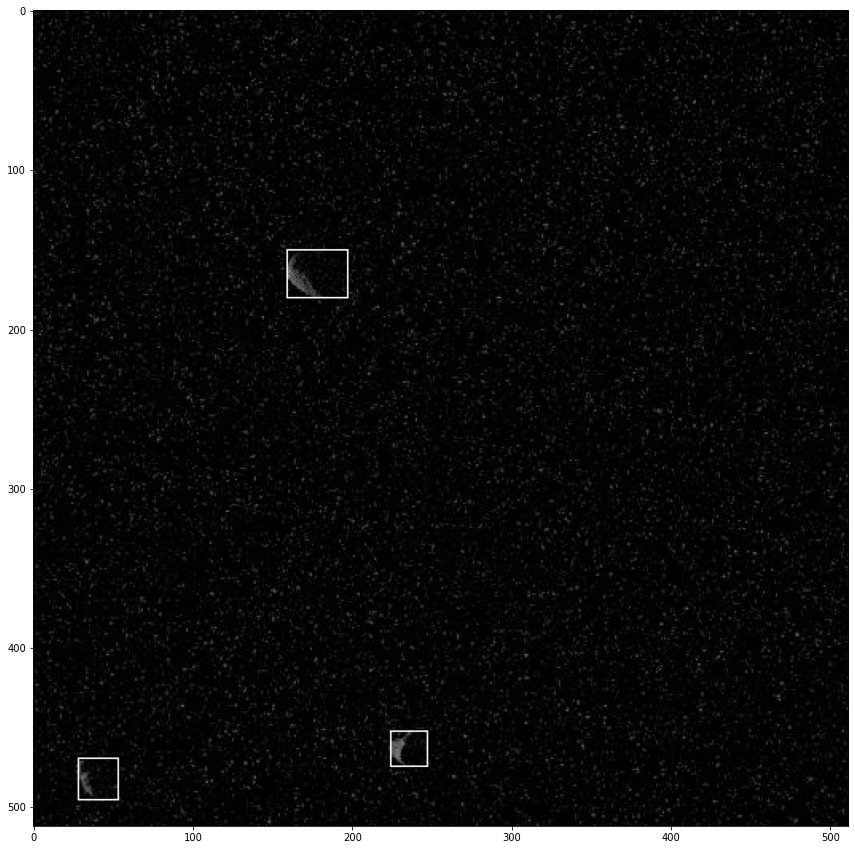

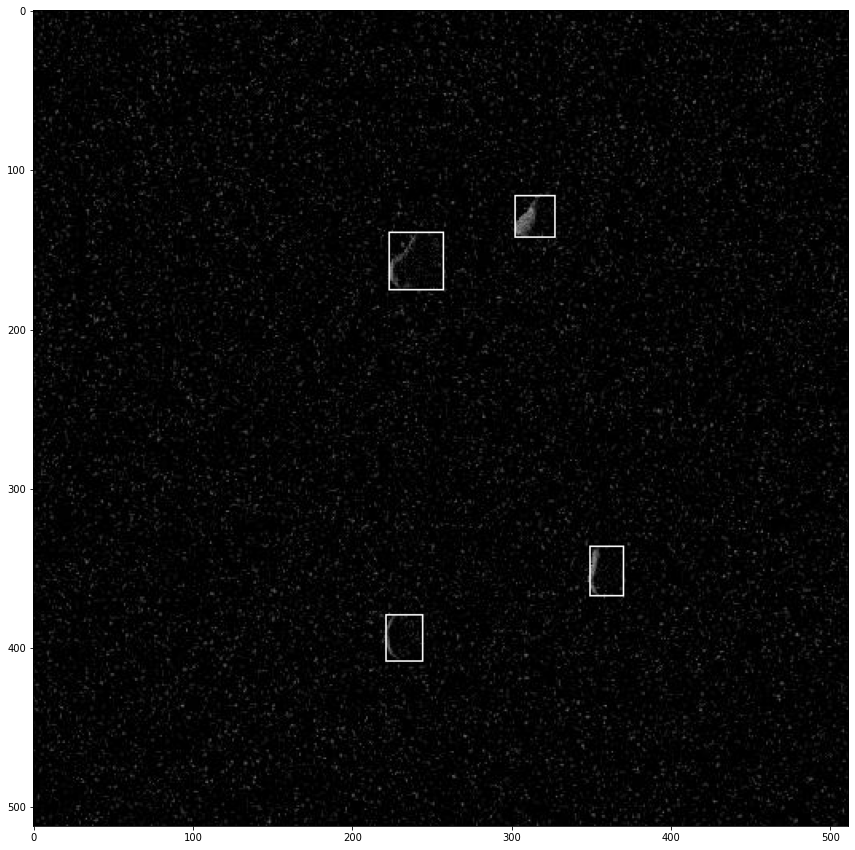

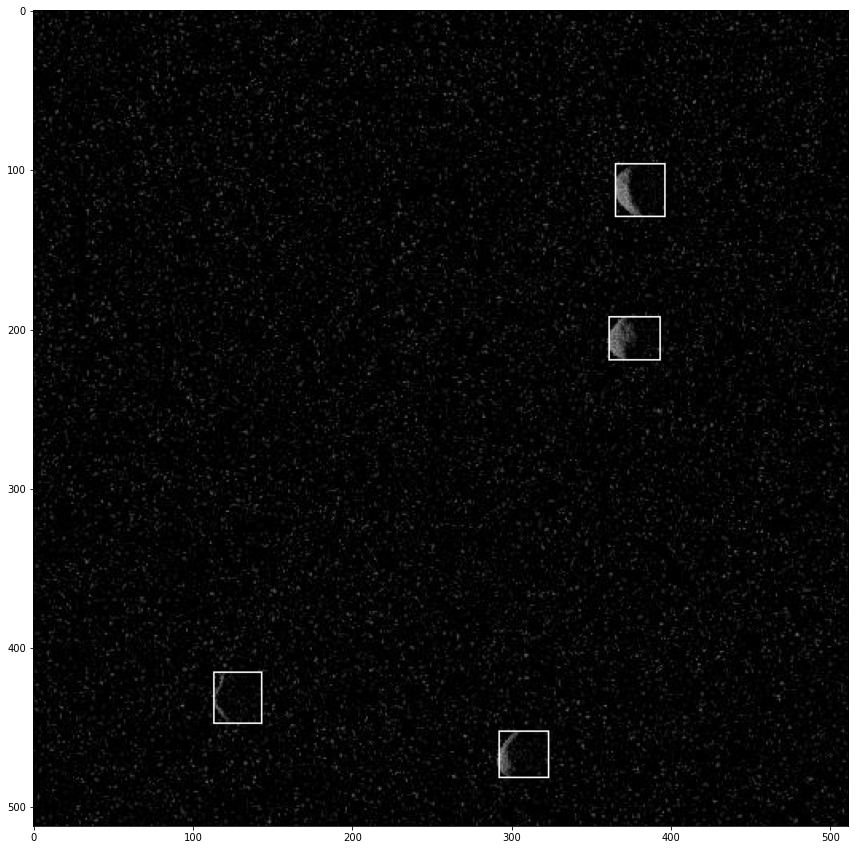

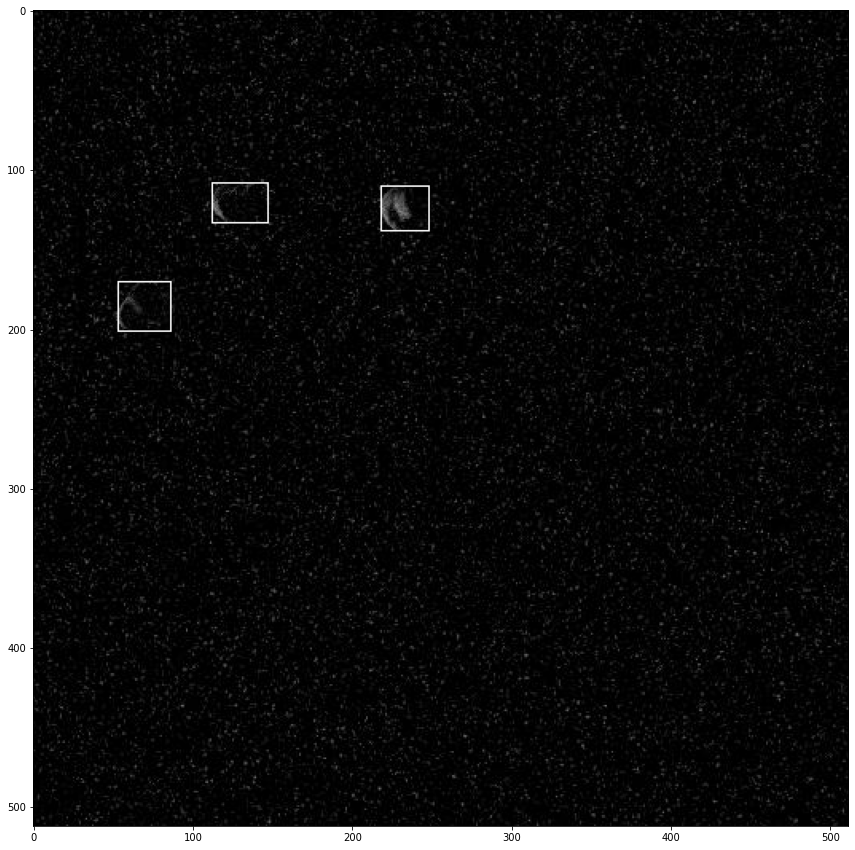

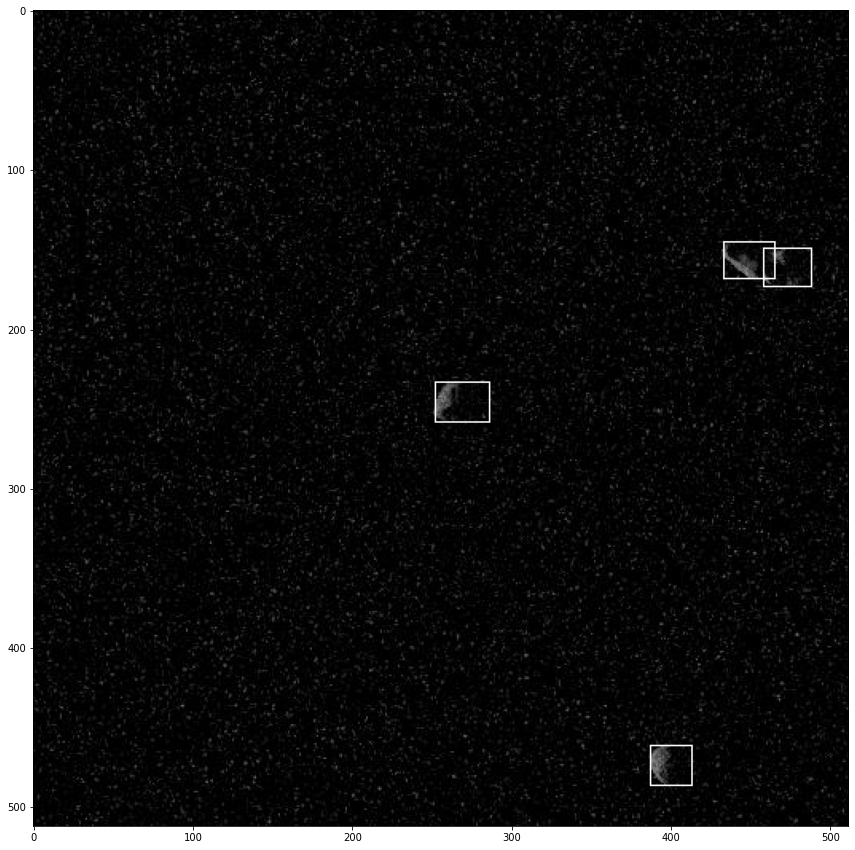

In [9]:
def show_images(images, num = 5):
    
    images_to_show = np.random.choice(images, num)

    for image_id in images_to_show:

        image = Image.open(os.path.join(data_path, f"train/{image_id}.jpg"))
  
        bboxes = literal_eval(train_df.loc[train_df['ImageID'] == image_id]['bboxes'].values[0])

        draw = ImageDraw.Draw(image)
        for bbox in bboxes:   
            draw.rectangle([bbox[0], bbox[2], bbox[1], bbox[3]], width=1)

        plt.figure(figsize = (15,15))
        plt.imshow(image)
        plt.show()

show_images(train_df['ImageID'].unique(), num = 5)

In [10]:
dict_dataset = []
def get_dataset_dics():

    for index, row in train_df.iterrows():

        image = Image.open(os.path.join(data_path, f"train/{row['ImageID']}.jpg"))
        w, h = image.size
        
        ann_lst = []

        bboxes = literal_eval(row['bboxes'])

        for n, bbox in enumerate(bboxes):   
    
            ann_dict = {'bbox': [bbox[0], bbox[2], bbox[1], bbox[3]],
           'bbox_mode': BoxMode.XYXY_ABS,
           'category_id': 0, #i[1]['category_id'].values[0],
           'iscrowd': 0}
            
            ann_lst.append(ann_dict)

        image_dict = {'annotations': ann_lst,
            'file_name': os.path.join(data_path, f"train/{row['ImageID']}.jpg"),
            'height': h,
            'image_id': row["ImageID"], #i[1]['image_category_id'].values[0],
            'width': w}
          
        dict_dataset.append(image_dict)

    return dict_dataset

dict_dataset = get_dataset_dics()

In [11]:
d = f"debris_train{np.random.randint(10000)}"
DatasetCatalog.register(d, lambda d=d : get_dataset_dics())
MetadataCatalog.get(d).set(thing_classes=["Debris"])
obj_metadata = MetadataCatalog.get(d)

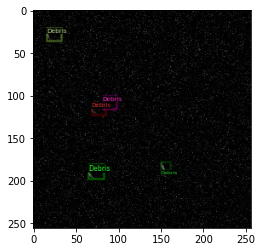

In [12]:
for i in random.sample(dict_dataset, 3):
    img = cv2.imread(i["file_name"])
    visualizer = Visualizer(img, metadata=obj_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(i)
    plt.imshow(out.get_image())

In [13]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml"))
cfg.DATASETS.TRAIN = (d,)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 200
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [14]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/14 05:52:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_68d202.pkl: 663MB [01:01, 10.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[12/14 05:53:23 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:103: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_fg = fg_inds.nonzero().numel()


[12/14 05:54:07 d2.utils.events]:  eta: 0:06:43  iter: 19  total_loss: 1.237  loss_cls: 0.6605  loss_box_reg: 0.586  loss_rpn_cls: 0.03777  loss_rpn_loc: 0.009856  time: 2.2174  data_time: 0.0203  lr: 2.3976e-05  max_mem: 3592M
[12/14 05:54:52 d2.utils.events]:  eta: 0:05:58  iter: 39  total_loss: 1.185  loss_cls: 0.4143  loss_box_reg: 0.6864  loss_rpn_cls: 0.03136  loss_rpn_loc: 0.009501  time: 2.2349  data_time: 0.0066  lr: 4.8951e-05  max_mem: 3592M
[12/14 05:55:36 d2.utils.events]:  eta: 0:05:11  iter: 59  total_loss: 0.9876  loss_cls: 0.2934  loss_box_reg: 0.6554  loss_rpn_cls: 0.01526  loss_rpn_loc: 0.01037  time: 2.2079  data_time: 0.0063  lr: 7.3926e-05  max_mem: 3592M
[12/14 05:56:20 d2.utils.events]:  eta: 0:04:27  iter: 79  total_loss: 0.8771  loss_cls: 0.2088  loss_box_reg: 0.6807  loss_rpn_cls: 0.009175  loss_rpn_loc: 0.007817  time: 2.2054  data_time: 0.0060  lr: 9.8901e-05  max_mem: 3592M
[12/14 05:57:03 d2.utils.events]:  eta: 0:03:42  iter: 99  total_loss: 0.8869  loss

In [15]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [16]:

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

In [17]:
test_imgs_paths = os.listdir(os.path.join(data_path, "test"))

predictions = {"ImageID":[], "bboxes":[]}

for test_img_path in tqdm(test_imgs_paths):

  img = cv2.imread(os.path.join(data_path, "test", test_img_path))
  h, w, _ = img.shape

  model_predictions = predictor(img)

  bboxes = model_predictions['instances'].pred_boxes.tensor.cpu().numpy().tolist()
  scores = model_predictions['instances'].scores.cpu().numpy().tolist()

  for n, bbox in enumerate(bboxes):

      bboxes[n] == bbox.append(scores[n])

  image_id = test_img_path.split('.')[0]

  predictions['ImageID'].append(image_id)
  predictions['bboxes'].append(bboxes)


  0%|          | 0/5000 [00:00<?, ?it/s]

In [19]:
submission = pd.DataFrame(predictions)
submission

,ImageID,bboxes
0,2267,"[[294.0844421386719, 279.58251953125, 318.2828..."
1,862,"[[371.3399658203125, 281.4029846191406, 394.07..."
2,4649,"[[266.5154724121094, 262.4350280761719, 289.49..."
3,3271,"[[418.5921630859375, 437.7823486328125, 443.80..."
4,1595,"[[71.655517578125, 458.8368225097656, 94.83148..."
...,...,...
4995,4430,"[[464.31756591796875, 282.589111328125, 484.16..."
4996,4104,"[[397.1779479980469, 221.34939575195312, 420.6..."
4997,1982,"[[46.28157424926758, 142.2936248779297, 70.800..."
4998,3142,"[[298.6401062011719, 322.6775817871094, 318.37..."
